## FCM


Mean (Original): 0.3496
STD (Original): 0.2375
Mean (Noisy): 0.3501
STD (Noisy): 0.2388
Mean (Clustered): 0.4007
STD (Clustered): 0.0973
Similarity Accuracy (SA) - Noisy: 0.9693
Similarity Accuracy (SA) - Clustered: 0.7528
Dissimilarity Score (SDS) - Noisy: 0.9361
Dissimilarity Score (SDS) - Clustered: 0.4336
Matthews Correlation Coefficient (MCC) - Noisy: 0.9160
Matthews Correlation Coefficient (MCC) - Clustered: 0.2789


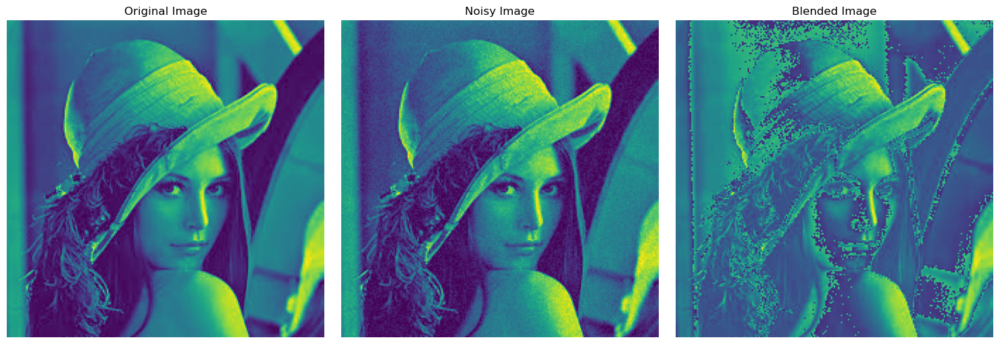

In [4]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage import img_as_float
from PIL import Image
import skfuzzy as fuzz
from sklearn.metrics import confusion_matrix
# Function to add Gaussian noise
def add_gaussian_noise(image, mean=0, std=0.15):
    gaussian_noise = np.random.normal(mean, std, image.shape)
    noisy_image = image + gaussian_noise
    noisy_image = np.clip(noisy_image, 0, 1)  # Ensure pixel values stay within valid range
    return noisy_image

# Function to calculate spatial information
def calculate_spatial_information(image):
    kernel = np.ones((3, 3), np.float32) / 9
    sp_info = cv2.filter2D(image, -1, kernel)
    return sp_info

# Calculate evaluation metrics
def calculate_metrics(original_image, noisy_image, clustered_image):
    # Threshold the images to create binary images for confusion matrix
    original_binary = (original_image > 0.5).astype(int)
    noisy_binary = (noisy_image > 0.5).astype(int)
    clustered_binary = (clustered_image > 0.5).astype(int)

    # Calculate confusion matrix for noisy and original image
    tn_o, fp_o, fn_o, tp_o = confusion_matrix(original_binary.flatten(), noisy_binary.flatten()).ravel()
    tn_c, fp_c, fn_c, tp_c = confusion_matrix(original_binary.flatten(), clustered_binary.flatten()).ravel()

    # Similarity Accuracy (SA)
    SA_noisy = (tp_o + tn_o) / (tp_o + tn_o + fp_o + fn_o)
    SA_clustered = (tp_c + tn_c) / (tp_c + tn_c + fp_c + fn_c)

    # Dissimilarity Score (SDS)
    SDS_noisy = (2 * tp_o) / ((2 * tp_o) + fp_o + fn_o)
    SDS_clustered = (2 * tp_c) / ((2 * tp_c) + fp_c + fn_c)

    # Matthews Correlation Coefficient (MCC)
    MCC_noisy = (tp_o * tn_o - fp_o * fn_o) / np.sqrt((tp_o + fp_o) * (tp_o + fn_o) * (tn_o + fp_o) * (tn_o + fn_o))
    MCC_clustered = (tp_c * tn_c - fp_c * fn_c) / np.sqrt((tp_c + fp_c) * (tp_c + fn_c) * (tn_c + fp_c) * (tn_c + fn_c))

    # Mean and Standard Deviation
    mean_original = np.mean(original_image)
    std_original = np.std(original_image)
    mean_noisy = np.mean(noisy_image)
    std_noisy = np.std(noisy_image)
    mean_clustered = np.mean(clustered_image)
    std_clustered = np.std(clustered_image)

    return {
        "Mean (Original)": mean_original,
        "STD (Original)": std_original,
        "Mean (Noisy)": mean_noisy,
        "STD (Noisy)": std_noisy,
        "Mean (Clustered)": mean_clustered,
        "STD (Clustered)": std_clustered,
        "Similarity Accuracy (SA) - Noisy": SA_noisy,
        "Similarity Accuracy (SA) - Clustered": SA_clustered,
        "Dissimilarity Score (SDS) - Noisy": SDS_noisy,
        "Dissimilarity Score (SDS) - Clustered": SDS_clustered,
        "Matthews Correlation Coefficient (MCC) - Noisy": MCC_noisy,
        "Matthews Correlation Coefficient (MCC) - Clustered": MCC_clustered
    }

# Load and preprocess the original image
image_path = 'D:/Journal/4/code/lena.jpg'
original_image = Image.open(image_path).convert('L')  # Convert to grayscale
original_image = img_as_float(np.array(original_image))

# Add Gaussian noise to the original image
noisy_image = add_gaussian_noise(original_image, mean=0, std=0.03)

# Flatten the noisy image for clustering
data = noisy_image.flatten().astype(np.float32)  # Convert to float32 and 1D array

# Apply Fuzzy C-Means clustering
n_clusters = 2  # Number of clusters
cntr, u, _, _, _, _, _ = fuzz.cluster.cmeans(
    data.reshape(1, -1), c=n_clusters, m=2, error=0.005, maxiter=100, init=None
)

# Reshape the membership matrix to obtain the clustered labels
cluster_labels = np.argmax(u, axis=0)
clustered_img = cluster_labels.reshape(noisy_image.shape)

# Blend the original and clustered images
alpha = 0.7  # Blending ratio
blended_image = cv2.addWeighted(original_image, alpha, clustered_img.astype(float), 1 - alpha, 0)

# Calculate metrics for original, noisy, and clustered images
metrics = calculate_metrics(original_image, noisy_image, blended_image)

# Print the results
for metric, value in metrics.items():
    print(f"{metric}: {value:.4f}")

# Plot the images
plt.figure(figsize=(15, 5))

# Original image
plt.subplot(1, 3, 1)
plt.imshow(original_image)
plt.title("Original Image")
plt.axis('off')

# Noisy image
plt.subplot(1, 3, 2)
plt.imshow(noisy_image)
plt.title("Noisy Image")
plt.axis('off')

# Blended image
plt.subplot(1, 3, 3)
plt.imshow(blended_image)
plt.title("Blended Image")
plt.axis('off')

plt.tight_layout()
plt.show()


Mean (Original): 0.3496
STD (Original): 0.2375
Mean (Noisy): 0.3510
STD (Noisy): 0.2404
Mean (Clustered): 0.4050
STD (Clustered): 0.0999
Similarity Accuracy (SA) - Noisy: 0.9485
Similarity Accuracy (SA) - Clustered: 0.7373
Dissimilarity Score (SDS) - Noisy: 0.8942
Dissimilarity Score (SDS) - Clustered: 0.4189
Matthews Correlation Coefficient (MCC) - Noisy: 0.8606
Matthews Correlation Coefficient (MCC) - Clustered: 0.2503


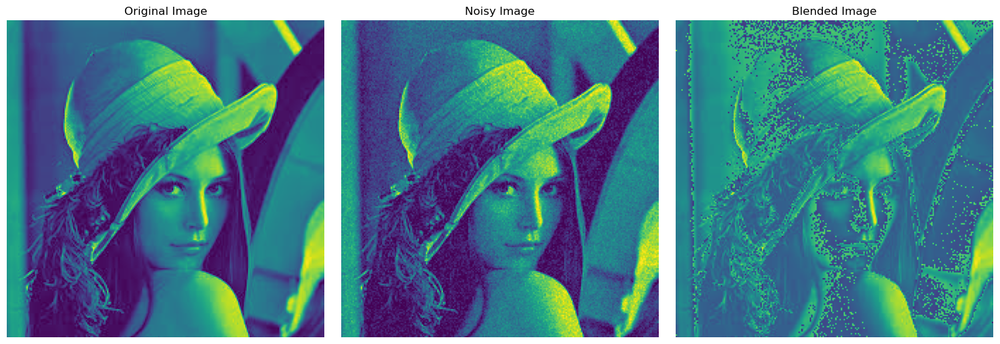

In [5]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage import img_as_float
from PIL import Image
import skfuzzy as fuzz

# Function to add Gaussian noise
def add_gaussian_noise(image, mean=0, std=0.15):
    gaussian_noise = np.random.normal(mean, std, image.shape)
    noisy_image = image + gaussian_noise
    noisy_image = np.clip(noisy_image, 0, 1)  # Ensure pixel values stay within valid range
    return noisy_image

# Function to calculate spatial information
def calculate_spatial_information(image):
    kernel = np.ones((3, 3), np.float32) / 9
    sp_info = cv2.filter2D(image, -1, kernel)
    return sp_info

# Calculate evaluation metrics
def calculate_metrics(original_image, noisy_image, clustered_image):
    # Threshold the images to create binary images for confusion matrix
    original_binary = (original_image > 0.5).astype(int)
    noisy_binary = (noisy_image > 0.5).astype(int)
    clustered_binary = (clustered_image > 0.5).astype(int)

    # Calculate confusion matrix for noisy and original image
    tn_o, fp_o, fn_o, tp_o = confusion_matrix(original_binary.flatten(), noisy_binary.flatten()).ravel()
    tn_c, fp_c, fn_c, tp_c = confusion_matrix(original_binary.flatten(), clustered_binary.flatten()).ravel()

    # Similarity Accuracy (SA)
    SA_noisy = (tp_o + tn_o) / (tp_o + tn_o + fp_o + fn_o)
    SA_clustered = (tp_c + tn_c) / (tp_c + tn_c + fp_c + fn_c)

    # Dissimilarity Score (SDS)
    SDS_noisy = (2 * tp_o) / ((2 * tp_o) + fp_o + fn_o)
    SDS_clustered = (2 * tp_c) / ((2 * tp_c) + fp_c + fn_c)

    # Matthews Correlation Coefficient (MCC)
    MCC_noisy = (tp_o * tn_o - fp_o * fn_o) / np.sqrt((tp_o + fp_o) * (tp_o + fn_o) * (tn_o + fp_o) * (tn_o + fn_o))
    MCC_clustered = (tp_c * tn_c - fp_c * fn_c) / np.sqrt((tp_c + fp_c) * (tp_c + fn_c) * (tn_c + fp_c) * (tn_c + fn_c))

    # Mean and Standard Deviation
    mean_original = np.mean(original_image)
    std_original = np.std(original_image)
    mean_noisy = np.mean(noisy_image)
    std_noisy = np.std(noisy_image)
    mean_clustered = np.mean(clustered_image)
    std_clustered = np.std(clustered_image)

    return {
        "Mean (Original)": mean_original,
        "STD (Original)": std_original,
        "Mean (Noisy)": mean_noisy,
        "STD (Noisy)": std_noisy,
        "Mean (Clustered)": mean_clustered,
        "STD (Clustered)": std_clustered,
        "Similarity Accuracy (SA) - Noisy": SA_noisy,
        "Similarity Accuracy (SA) - Clustered": SA_clustered,
        "Dissimilarity Score (SDS) - Noisy": SDS_noisy,
        "Dissimilarity Score (SDS) - Clustered": SDS_clustered,
        "Matthews Correlation Coefficient (MCC) - Noisy": MCC_noisy,
        "Matthews Correlation Coefficient (MCC) - Clustered": MCC_clustered
    }

# Load and preprocess the original image
image_path = 'D:/Journal/4/code/lena.jpg'
original_image = Image.open(image_path).convert('L')  # Convert to grayscale
original_image = img_as_float(np.array(original_image))

# Add Gaussian noise to the original image
noisy_image = add_gaussian_noise(original_image, mean=0, std=0.05)

# Flatten the noisy image for clustering
data = noisy_image.flatten().astype(np.float32)  # Convert to float32 and 1D array

# Apply Fuzzy C-Means clustering
n_clusters = 2  # Number of clusters
cntr, u, _, _, _, _, _ = fuzz.cluster.cmeans(
    data.reshape(1, -1), c=n_clusters, m=2, error=0.005, maxiter=100, init=None
)

# Reshape the membership matrix to obtain the clustered labels
cluster_labels = np.argmax(u, axis=0)
clustered_img = cluster_labels.reshape(noisy_image.shape)

# Blend the original and clustered images
alpha = 0.7  # Blending ratio
blended_image = cv2.addWeighted(original_image, alpha, clustered_img.astype(float), 1 - alpha, 0)

# Calculate metrics for original, noisy, and clustered images
metrics = calculate_metrics(original_image, noisy_image, blended_image)

# Print the results
for metric, value in metrics.items():
    print(f"{metric}: {value:.4f}")

# Plot the images
plt.figure(figsize=(15, 5))

# Original image
plt.subplot(1, 3, 1)
plt.imshow(original_image)
plt.title("Original Image")
plt.axis('off')

# Noisy image
plt.subplot(1, 3, 2)
plt.imshow(noisy_image)
plt.title("Noisy Image")
plt.axis('off')

# Blended image
plt.subplot(1, 3, 3)
plt.imshow(blended_image)
plt.title("Blended Image")
plt.axis('off')

plt.tight_layout()
plt.show()


Mean (Original): 0.3496
STD (Original): 0.2375
Mean (Noisy): 0.3538
STD (Noisy): 0.2480
Mean (Clustered): 0.4127
STD (Clustered): 0.1105
Similarity Accuracy (SA) - Noisy: 0.9004
Similarity Accuracy (SA) - Clustered: 0.7113
Dissimilarity Score (SDS) - Noisy: 0.8035
Dissimilarity Score (SDS) - Clustered: 0.4089
Matthews Correlation Coefficient (MCC) - Noisy: 0.7397
Matthews Correlation Coefficient (MCC) - Clustered: 0.2182


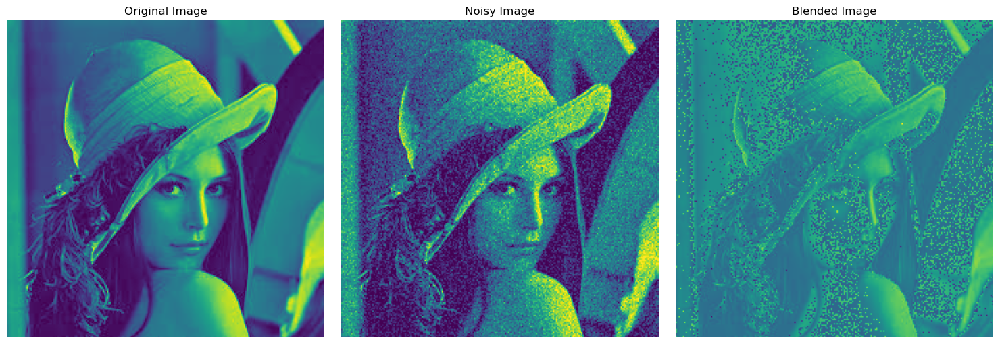

In [6]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage import img_as_float
from PIL import Image
import skfuzzy as fuzz

# Function to add Gaussian noise
def add_gaussian_noise(image, mean=0, std=0.15):
    gaussian_noise = np.random.normal(mean, std, image.shape)
    noisy_image = image + gaussian_noise
    noisy_image = np.clip(noisy_image, 0, 1)  # Ensure pixel values stay within valid range
    return noisy_image

# Function to calculate spatial information
def calculate_spatial_information(image):
    kernel = np.ones((3, 3), np.float32) / 9
    sp_info = cv2.filter2D(image, -1, kernel)
    return sp_info

# Calculate evaluation metrics
def calculate_metrics(original_image, noisy_image, clustered_image):
    # Threshold the images to create binary images for confusion matrix
    original_binary = (original_image > 0.5).astype(int)
    noisy_binary = (noisy_image > 0.5).astype(int)
    clustered_binary = (clustered_image > 0.5).astype(int)

    # Calculate confusion matrix for noisy and original image
    tn_o, fp_o, fn_o, tp_o = confusion_matrix(original_binary.flatten(), noisy_binary.flatten()).ravel()
    tn_c, fp_c, fn_c, tp_c = confusion_matrix(original_binary.flatten(), clustered_binary.flatten()).ravel()

    # Similarity Accuracy (SA)
    SA_noisy = (tp_o + tn_o) / (tp_o + tn_o + fp_o + fn_o)
    SA_clustered = (tp_c + tn_c) / (tp_c + tn_c + fp_c + fn_c)

    # Dissimilarity Score (SDS)
    SDS_noisy = (2 * tp_o) / ((2 * tp_o) + fp_o + fn_o)
    SDS_clustered = (2 * tp_c) / ((2 * tp_c) + fp_c + fn_c)

    # Matthews Correlation Coefficient (MCC)
    MCC_noisy = (tp_o * tn_o - fp_o * fn_o) / np.sqrt((tp_o + fp_o) * (tp_o + fn_o) * (tn_o + fp_o) * (tn_o + fn_o))
    MCC_clustered = (tp_c * tn_c - fp_c * fn_c) / np.sqrt((tp_c + fp_c) * (tp_c + fn_c) * (tn_c + fp_c) * (tn_c + fn_c))

    # Mean and Standard Deviation
    mean_original = np.mean(original_image)
    std_original = np.std(original_image)
    mean_noisy = np.mean(noisy_image)
    std_noisy = np.std(noisy_image)
    mean_clustered = np.mean(clustered_image)
    std_clustered = np.std(clustered_image)

    return {
        "Mean (Original)": mean_original,
        "STD (Original)": std_original,
        "Mean (Noisy)": mean_noisy,
        "STD (Noisy)": std_noisy,
        "Mean (Clustered)": mean_clustered,
        "STD (Clustered)": std_clustered,
        "Similarity Accuracy (SA) - Noisy": SA_noisy,
        "Similarity Accuracy (SA) - Clustered": SA_clustered,
        "Dissimilarity Score (SDS) - Noisy": SDS_noisy,
        "Dissimilarity Score (SDS) - Clustered": SDS_clustered,
        "Matthews Correlation Coefficient (MCC) - Noisy": MCC_noisy,
        "Matthews Correlation Coefficient (MCC) - Clustered": MCC_clustered
    }

# Load and preprocess the original image
image_path = 'D:/Journal/4/code/lena.jpg'
original_image = Image.open(image_path).convert('L')  # Convert to grayscale
original_image = img_as_float(np.array(original_image))

# Add Gaussian noise to the original image
noisy_image = add_gaussian_noise(original_image, mean=0, std=0.1)

# Flatten the noisy image for clustering
data = noisy_image.flatten().astype(np.float32)  # Convert to float32 and 1D array

# Apply Fuzzy C-Means clustering
n_clusters = 2  # Number of clusters
cntr, u, _, _, _, _, _ = fuzz.cluster.cmeans(
    data.reshape(1, -1), c=n_clusters, m=2, error=0.005, maxiter=100, init=None
)

# Reshape the membership matrix to obtain the clustered labels
cluster_labels = np.argmax(u, axis=0)
clustered_img = cluster_labels.reshape(noisy_image.shape)

# Blend the original and clustered images
alpha = 0.7  # Blending ratio
blended_image = cv2.addWeighted(original_image, alpha, clustered_img.astype(float), 1 - alpha, 0)

# Calculate metrics for original, noisy, and clustered images
metrics = calculate_metrics(original_image, noisy_image, blended_image)

# Print the results
for metric, value in metrics.items():
    print(f"{metric}: {value:.4f}")

# Plot the images
plt.figure(figsize=(15, 5))

# Original image
plt.subplot(1, 3, 1)
plt.imshow(original_image)
plt.title("Original Image")
plt.axis('off')

# Noisy image
plt.subplot(1, 3, 2)
plt.imshow(noisy_image)
plt.title("Noisy Image")
plt.axis('off')

# Blended image
plt.subplot(1, 3, 3)
plt.imshow(blended_image)
plt.title("Blended Image")
plt.axis('off')

plt.tight_layout()
plt.show()


Mean (Original): 0.3496
STD (Original): 0.2375
Mean (Noisy): 0.3581
STD (Noisy): 0.2607
Mean (Clustered): 0.4165
STD (Clustered): 0.1218
Similarity Accuracy (SA) - Noisy: 0.8590
Similarity Accuracy (SA) - Clustered: 0.7071
Dissimilarity Score (SDS) - Noisy: 0.7320
Dissimilarity Score (SDS) - Clustered: 0.4303
Matthews Correlation Coefficient (MCC) - Noisy: 0.6430
Matthews Correlation Coefficient (MCC) - Clustered: 0.2359


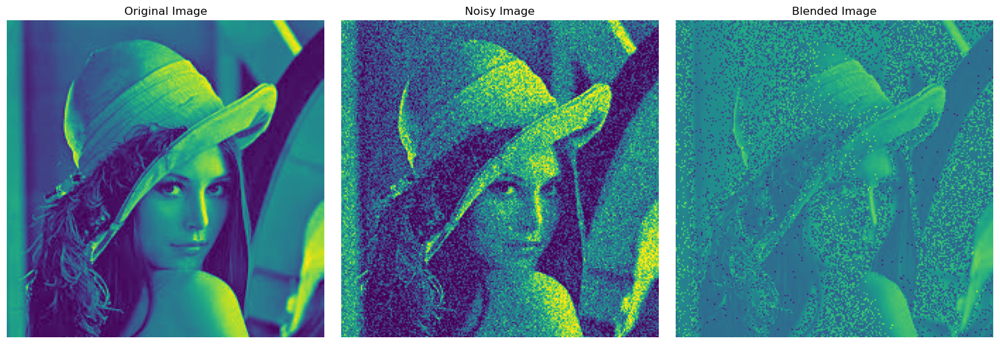

In [7]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage import img_as_float
from PIL import Image
import skfuzzy as fuzz

# Function to add Gaussian noise
def add_gaussian_noise(image, mean=0, std=0.15):
    gaussian_noise = np.random.normal(mean, std, image.shape)
    noisy_image = image + gaussian_noise
    noisy_image = np.clip(noisy_image, 0, 1)  # Ensure pixel values stay within valid range
    return noisy_image

# Function to calculate spatial information
def calculate_spatial_information(image):
    kernel = np.ones((3, 3), np.float32) / 9
    sp_info = cv2.filter2D(image, -1, kernel)
    return sp_info

# Calculate evaluation metrics
def calculate_metrics(original_image, noisy_image, clustered_image):
    # Threshold the images to create binary images for confusion matrix
    original_binary = (original_image > 0.5).astype(int)
    noisy_binary = (noisy_image > 0.5).astype(int)
    clustered_binary = (clustered_image > 0.5).astype(int)

    # Calculate confusion matrix for noisy and original image
    tn_o, fp_o, fn_o, tp_o = confusion_matrix(original_binary.flatten(), noisy_binary.flatten()).ravel()
    tn_c, fp_c, fn_c, tp_c = confusion_matrix(original_binary.flatten(), clustered_binary.flatten()).ravel()

    # Similarity Accuracy (SA)
    SA_noisy = (tp_o + tn_o) / (tp_o + tn_o + fp_o + fn_o)
    SA_clustered = (tp_c + tn_c) / (tp_c + tn_c + fp_c + fn_c)

    # Dissimilarity Score (SDS)
    SDS_noisy = (2 * tp_o) / ((2 * tp_o) + fp_o + fn_o)
    SDS_clustered = (2 * tp_c) / ((2 * tp_c) + fp_c + fn_c)

    # Matthews Correlation Coefficient (MCC)
    MCC_noisy = (tp_o * tn_o - fp_o * fn_o) / np.sqrt((tp_o + fp_o) * (tp_o + fn_o) * (tn_o + fp_o) * (tn_o + fn_o))
    MCC_clustered = (tp_c * tn_c - fp_c * fn_c) / np.sqrt((tp_c + fp_c) * (tp_c + fn_c) * (tn_c + fp_c) * (tn_c + fn_c))

    # Mean and Standard Deviation
    mean_original = np.mean(original_image)
    std_original = np.std(original_image)
    mean_noisy = np.mean(noisy_image)
    std_noisy = np.std(noisy_image)
    mean_clustered = np.mean(clustered_image)
    std_clustered = np.std(clustered_image)

    return {
        "Mean (Original)": mean_original,
        "STD (Original)": std_original,
        "Mean (Noisy)": mean_noisy,
        "STD (Noisy)": std_noisy,
        "Mean (Clustered)": mean_clustered,
        "STD (Clustered)": std_clustered,
        "Similarity Accuracy (SA) - Noisy": SA_noisy,
        "Similarity Accuracy (SA) - Clustered": SA_clustered,
        "Dissimilarity Score (SDS) - Noisy": SDS_noisy,
        "Dissimilarity Score (SDS) - Clustered": SDS_clustered,
        "Matthews Correlation Coefficient (MCC) - Noisy": MCC_noisy,
        "Matthews Correlation Coefficient (MCC) - Clustered": MCC_clustered
    }

# Load and preprocess the original image
image_path = 'D:/Journal/4/code/lena.jpg'
original_image = Image.open(image_path).convert('L')  # Convert to grayscale
original_image = img_as_float(np.array(original_image))

# Add Gaussian noise to the original image
noisy_image = add_gaussian_noise(original_image, mean=0, std=0.15)

# Flatten the noisy image for clustering
data = noisy_image.flatten().astype(np.float32)  # Convert to float32 and 1D array

# Apply Fuzzy C-Means clustering
n_clusters = 2  # Number of clusters
cntr, u, _, _, _, _, _ = fuzz.cluster.cmeans(
    data.reshape(1, -1), c=n_clusters, m=2, error=0.005, maxiter=100, init=None
)

# Reshape the membership matrix to obtain the clustered labels
cluster_labels = np.argmax(u, axis=0)
clustered_img = cluster_labels.reshape(noisy_image.shape)

# Blend the original and clustered images
alpha = 0.7  # Blending ratio
blended_image = cv2.addWeighted(original_image, alpha, clustered_img.astype(float), 1 - alpha, 0)

# Calculate metrics for original, noisy, and clustered images
metrics = calculate_metrics(original_image, noisy_image, blended_image)

# Print the results
for metric, value in metrics.items():
    print(f"{metric}: {value:.4f}")

# Plot the images
plt.figure(figsize=(15, 5))

# Original image
plt.subplot(1, 3, 1)
plt.imshow(original_image)
plt.title("Original Image")
plt.axis('off')

# Noisy image
plt.subplot(1, 3, 2)
plt.imshow(noisy_image)
plt.title("Noisy Image")
plt.axis('off')

# Blended image
plt.subplot(1, 3, 3)
plt.imshow(blended_image)
plt.title("Blended Image")
plt.axis('off')

plt.tight_layout()
plt.show()


##SALT

Mean (Original): 0.3496
STD (Original): 0.2375
Mean (Noisy): 0.3626
STD (Noisy): 0.2768
Mean (Clustered): 0.3711
STD (Clustered): 0.2931
Similarity Accuracy (SA) - Noisy: 0.9530
Similarity Accuracy (SA) - Clustered: 0.8164
Dissimilarity Score (SDS) - Noisy: 0.9057
Dissimilarity Score (SDS) - Clustered: 0.7150
Matthews Correlation Coefficient (MCC) - Noisy: 0.8762
Matthews Correlation Coefficient (MCC) - Clustered: 0.6392


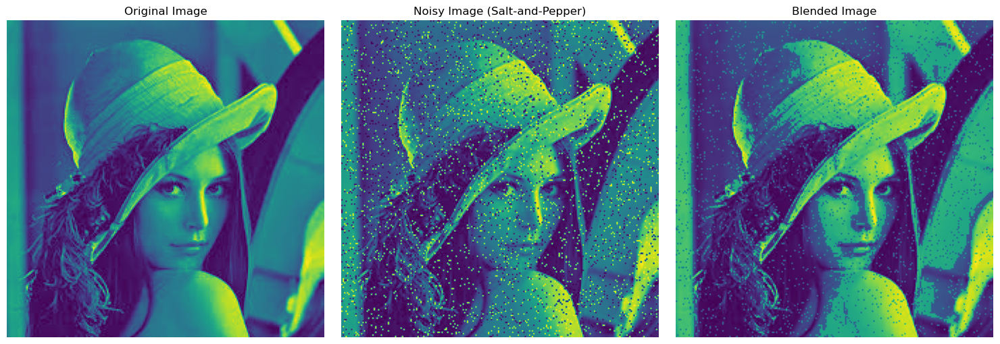

In [9]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage import img_as_float
from PIL import Image
import skfuzzy as fuzz
from sklearn.metrics import confusion_matrix

# Function to add salt-and-pepper noise
def add_salt_and_pepper_noise(image, salt_prob=0.05, pepper_prob=0.05):
    noisy_image = image.copy()
    num_salt = np.ceil(salt_prob * image.size).astype(int)
    coords_salt = [np.random.randint(0, i, num_salt) for i in image.shape]
    noisy_image[tuple(coords_salt)] = 1

    num_pepper = np.ceil(pepper_prob * image.size).astype(int)
    coords_pepper = [np.random.randint(0, i, num_pepper) for i in image.shape]
    noisy_image[tuple(coords_pepper)] = 0

    return noisy_image

# Function to calculate evaluation metrics
def calculate_metrics(original_image, noisy_image, clustered_image):
    original_binary = (original_image > 0.5).astype(int)
    noisy_binary = (noisy_image > 0.5).astype(int)
    clustered_binary = (clustered_image > 0.5).astype(int)

    tn_o, fp_o, fn_o, tp_o = confusion_matrix(original_binary.flatten(), noisy_binary.flatten()).ravel()
    tn_c, fp_c, fn_c, tp_c = confusion_matrix(original_binary.flatten(), clustered_binary.flatten()).ravel()

    SA_noisy = (tp_o + tn_o) / (tp_o + tn_o + fp_o + fn_o)
    SA_clustered = (tp_c + tn_c) / (tp_c + tn_c + fp_c + fn_c)

    SDS_noisy = (2 * tp_o) / ((2 * tp_o) + fp_o + fn_o)
    SDS_clustered = (2 * tp_c) / ((2 * tp_c) + fp_c + fn_c)

    MCC_noisy = (tp_o * tn_o - fp_o * fn_o) / np.sqrt((tp_o + fp_o) * (tp_o + fn_o) * (tn_o + fp_o) * (tn_o + fn_o))
    MCC_clustered = (tp_c * tn_c - fp_c * fn_c) / np.sqrt((tp_c + fp_c) * (tp_c + fn_c) * (tn_c + fp_c) * (tn_c + fn_c))

    mean_original = np.mean(original_image)
    std_original = np.std(original_image)
    mean_noisy = np.mean(noisy_image)
    std_noisy = np.std(noisy_image)
    mean_clustered = np.mean(clustered_image)
    std_clustered = np.std(clustered_image)

    return {
        "Mean (Original)": mean_original,
        "STD (Original)": std_original,
        "Mean (Noisy)": mean_noisy,
        "STD (Noisy)": std_noisy,
        "Mean (Clustered)": mean_clustered,
        "STD (Clustered)": std_clustered,
        "Similarity Accuracy (SA) - Noisy": SA_noisy,
        "Similarity Accuracy (SA) - Clustered": SA_clustered,
        "Dissimilarity Score (SDS) - Noisy": SDS_noisy,
        "Dissimilarity Score (SDS) - Clustered": SDS_clustered,
        "Matthews Correlation Coefficient (MCC) - Noisy": MCC_noisy,
        "Matthews Correlation Coefficient (MCC) - Clustered": MCC_clustered
    }

# Load and preprocess the original image
image_path = 'D:/Journal/4/code/lena.jpg'
original_image = Image.open(image_path).convert('L')  # Convert to grayscale
original_image = img_as_float(np.array(original_image))

# Add salt-and-pepper noise to the original image
noisy_image = add_salt_and_pepper_noise(original_image, salt_prob=0.05, pepper_prob=0.05)

# Flatten the noisy image for clustering
data = noisy_image.flatten().astype(np.float32)  # Convert to float32 and 1D array

# Apply Fuzzy C-Means clustering
n_clusters = 2  # Number of clusters
cntr, u, _, _, _, _, _ = fuzz.cluster.cmeans(
    data.reshape(1, -1), c=n_clusters, m=2, error=0.005, maxiter=1000, init=None
)

# Reshape the membership matrix to obtain the clustered labels
cluster_labels = np.argmax(u, axis=0)
clustered_img = cluster_labels.reshape(noisy_image.shape)

# Blend the original and clustered images
alpha = 0.7  # Blending ratio
blended_image = cv2.addWeighted(original_image, alpha, clustered_img.astype(float), 1 - alpha, 0)

# Calculate metrics for original, noisy, and clustered images
metrics = calculate_metrics(original_image, noisy_image, blended_image)

# Print the results
for metric, value in metrics.items():
    print(f"{metric}: {value:.4f}")

# Plot the images
plt.figure(figsize=(15, 5))

# Original image
plt.subplot(1, 3, 1)
plt.imshow(original_image)
plt.title("Original Image")
plt.axis('off')

# Noisy image
plt.subplot(1, 3, 2)
plt.imshow(noisy_image)
plt.title("Noisy Image (Salt-and-Pepper)")
plt.axis('off')

# Blended image
plt.subplot(1, 3, 3)
plt.imshow(blended_image)
plt.title("Blended Image")
plt.axis('off')

plt.tight_layout()
plt.show()


Mean (Original): 0.3496
STD (Original): 0.2375
Mean (Noisy): 0.3727
STD (Noisy): 0.3062
Mean (Clustered): 0.4451
STD (Clustered): 0.1341
Similarity Accuracy (SA) - Noisy: 0.9109
Similarity Accuracy (SA) - Clustered: 0.6050
Dissimilarity Score (SDS) - Noisy: 0.8282
Dissimilarity Score (SDS) - Clustered: 0.3543
Matthews Correlation Coefficient (MCC) - Noisy: 0.7735
Matthews Correlation Coefficient (MCC) - Clustered: 0.0945


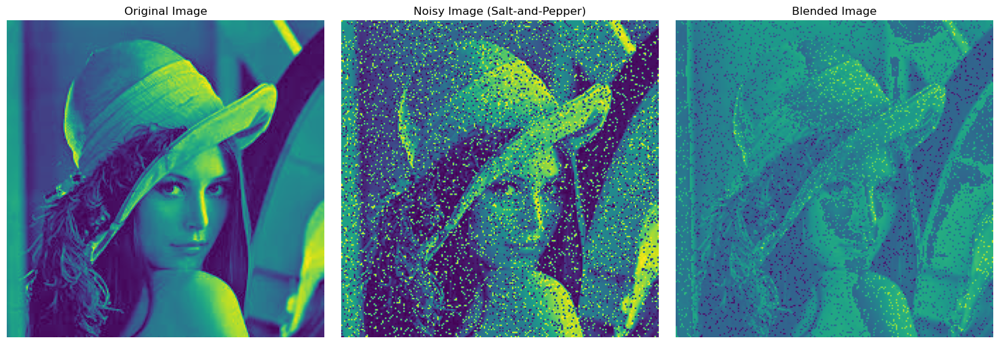

In [10]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage import img_as_float
from PIL import Image
import skfuzzy as fuzz
from sklearn.metrics import confusion_matrix

# Function to add salt-and-pepper noise
def add_salt_and_pepper_noise(image, salt_prob=0.05, pepper_prob=0.05):
    noisy_image = image.copy()
    num_salt = np.ceil(salt_prob * image.size).astype(int)
    coords_salt = [np.random.randint(0, i, num_salt) for i in image.shape]
    noisy_image[tuple(coords_salt)] = 1

    num_pepper = np.ceil(pepper_prob * image.size).astype(int)
    coords_pepper = [np.random.randint(0, i, num_pepper) for i in image.shape]
    noisy_image[tuple(coords_pepper)] = 0

    return noisy_image

# Function to calculate evaluation metrics
def calculate_metrics(original_image, noisy_image, clustered_image):
    original_binary = (original_image > 0.5).astype(int)
    noisy_binary = (noisy_image > 0.5).astype(int)
    clustered_binary = (clustered_image > 0.5).astype(int)

    tn_o, fp_o, fn_o, tp_o = confusion_matrix(original_binary.flatten(), noisy_binary.flatten()).ravel()
    tn_c, fp_c, fn_c, tp_c = confusion_matrix(original_binary.flatten(), clustered_binary.flatten()).ravel()

    SA_noisy = (tp_o + tn_o) / (tp_o + tn_o + fp_o + fn_o)
    SA_clustered = (tp_c + tn_c) / (tp_c + tn_c + fp_c + fn_c)

    SDS_noisy = (2 * tp_o) / ((2 * tp_o) + fp_o + fn_o)
    SDS_clustered = (2 * tp_c) / ((2 * tp_c) + fp_c + fn_c)

    MCC_noisy = (tp_o * tn_o - fp_o * fn_o) / np.sqrt((tp_o + fp_o) * (tp_o + fn_o) * (tn_o + fp_o) * (tn_o + fn_o))
    MCC_clustered = (tp_c * tn_c - fp_c * fn_c) / np.sqrt((tp_c + fp_c) * (tp_c + fn_c) * (tn_c + fp_c) * (tn_c + fn_c))

    mean_original = np.mean(original_image)
    std_original = np.std(original_image)
    mean_noisy = np.mean(noisy_image)
    std_noisy = np.std(noisy_image)
    mean_clustered = np.mean(clustered_image)
    std_clustered = np.std(clustered_image)

    return {
        "Mean (Original)": mean_original,
        "STD (Original)": std_original,
        "Mean (Noisy)": mean_noisy,
        "STD (Noisy)": std_noisy,
        "Mean (Clustered)": mean_clustered,
        "STD (Clustered)": std_clustered,
        "Similarity Accuracy (SA) - Noisy": SA_noisy,
        "Similarity Accuracy (SA) - Clustered": SA_clustered,
        "Dissimilarity Score (SDS) - Noisy": SDS_noisy,
        "Dissimilarity Score (SDS) - Clustered": SDS_clustered,
        "Matthews Correlation Coefficient (MCC) - Noisy": MCC_noisy,
        "Matthews Correlation Coefficient (MCC) - Clustered": MCC_clustered
    }

# Load and preprocess the original image
image_path = 'D:/Journal/4/code/lena.jpg'
original_image = Image.open(image_path).convert('L')  # Convert to grayscale
original_image = img_as_float(np.array(original_image))

# Add salt-and-pepper noise to the original image
noisy_image = add_salt_and_pepper_noise(original_image, salt_prob=0.1, pepper_prob=0.1)

# Flatten the noisy image for clustering
data = noisy_image.flatten().astype(np.float32)  # Convert to float32 and 1D array

# Apply Fuzzy C-Means clustering
n_clusters = 2  # Number of clusters
cntr, u, _, _, _, _, _ = fuzz.cluster.cmeans(
    data.reshape(1, -1), c=n_clusters, m=2, error=0.005, maxiter=1000, init=None
)

# Reshape the membership matrix to obtain the clustered labels
cluster_labels = np.argmax(u, axis=0)
clustered_img = cluster_labels.reshape(noisy_image.shape)

# Blend the original and clustered images
alpha = 0.7  # Blending ratio
blended_image = cv2.addWeighted(original_image, alpha, clustered_img.astype(float), 1 - alpha, 0)

# Calculate metrics for original, noisy, and clustered images
metrics = calculate_metrics(original_image, noisy_image, blended_image)

# Print the results
for metric, value in metrics.items():
    print(f"{metric}: {value:.4f}")

# Plot the images
plt.figure(figsize=(15, 5))

# Original image
plt.subplot(1, 3, 1)
plt.imshow(original_image)
plt.title("Original Image")
plt.axis('off')

# Noisy image
plt.subplot(1, 3, 2)
plt.imshow(noisy_image)
plt.title("Noisy Image (Salt-and-Pepper)")
plt.axis('off')

# Blended image
plt.subplot(1, 3, 3)
plt.imshow(blended_image)
plt.title("Blended Image")
plt.axis('off')

plt.tight_layout()
plt.show()


Mean (Original): 0.3496
STD (Original): 0.2375
Mean (Noisy): 0.3790
STD (Noisy): 0.3298
Mean (Clustered): 0.4523
STD (Clustered): 0.1473
Similarity Accuracy (SA) - Noisy: 0.8759
Similarity Accuracy (SA) - Clustered: 0.5830
Dissimilarity Score (SDS) - Noisy: 0.7677
Dissimilarity Score (SDS) - Clustered: 0.3533
Matthews Correlation Coefficient (MCC) - Noisy: 0.6922
Matthews Correlation Coefficient (MCC) - Clustered: 0.0818


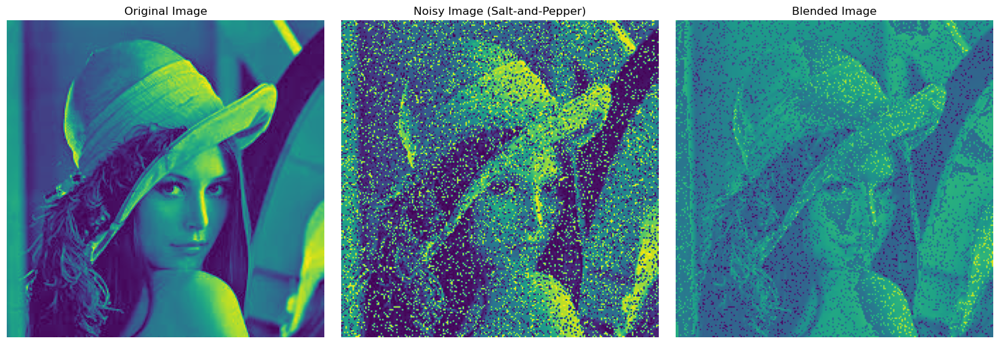

In [11]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from skimage import img_as_float
from PIL import Image
import skfuzzy as fuzz
from sklearn.metrics import confusion_matrix

# Function to add salt-and-pepper noise
def add_salt_and_pepper_noise(image, salt_prob=0.05, pepper_prob=0.05):
    noisy_image = image.copy()
    num_salt = np.ceil(salt_prob * image.size).astype(int)
    coords_salt = [np.random.randint(0, i, num_salt) for i in image.shape]
    noisy_image[tuple(coords_salt)] = 1

    num_pepper = np.ceil(pepper_prob * image.size).astype(int)
    coords_pepper = [np.random.randint(0, i, num_pepper) for i in image.shape]
    noisy_image[tuple(coords_pepper)] = 0

    return noisy_image

# Function to calculate evaluation metrics
def calculate_metrics(original_image, noisy_image, clustered_image):
    original_binary = (original_image > 0.5).astype(int)
    noisy_binary = (noisy_image > 0.5).astype(int)
    clustered_binary = (clustered_image > 0.5).astype(int)

    tn_o, fp_o, fn_o, tp_o = confusion_matrix(original_binary.flatten(), noisy_binary.flatten()).ravel()
    tn_c, fp_c, fn_c, tp_c = confusion_matrix(original_binary.flatten(), clustered_binary.flatten()).ravel()

    SA_noisy = (tp_o + tn_o) / (tp_o + tn_o + fp_o + fn_o)
    SA_clustered = (tp_c + tn_c) / (tp_c + tn_c + fp_c + fn_c)

    SDS_noisy = (2 * tp_o) / ((2 * tp_o) + fp_o + fn_o)
    SDS_clustered = (2 * tp_c) / ((2 * tp_c) + fp_c + fn_c)

    MCC_noisy = (tp_o * tn_o - fp_o * fn_o) / np.sqrt((tp_o + fp_o) * (tp_o + fn_o) * (tn_o + fp_o) * (tn_o + fn_o))
    MCC_clustered = (tp_c * tn_c - fp_c * fn_c) / np.sqrt((tp_c + fp_c) * (tp_c + fn_c) * (tn_c + fp_c) * (tn_c + fn_c))

    mean_original = np.mean(original_image)
    std_original = np.std(original_image)
    mean_noisy = np.mean(noisy_image)
    std_noisy = np.std(noisy_image)
    mean_clustered = np.mean(clustered_image)
    std_clustered = np.std(clustered_image)

    return {
        "Mean (Original)": mean_original,
        "STD (Original)": std_original,
        "Mean (Noisy)": mean_noisy,
        "STD (Noisy)": std_noisy,
        "Mean (Clustered)": mean_clustered,
        "STD (Clustered)": std_clustered,
        "Similarity Accuracy (SA) - Noisy": SA_noisy,
        "Similarity Accuracy (SA) - Clustered": SA_clustered,
        "Dissimilarity Score (SDS) - Noisy": SDS_noisy,
        "Dissimilarity Score (SDS) - Clustered": SDS_clustered,
        "Matthews Correlation Coefficient (MCC) - Noisy": MCC_noisy,
        "Matthews Correlation Coefficient (MCC) - Clustered": MCC_clustered
    }

# Load and preprocess the original image
image_path = 'D:/Journal/4/code/lena.jpg'
original_image = Image.open(image_path).convert('L')  # Convert to grayscale
original_image = img_as_float(np.array(original_image))

# Add salt-and-pepper noise to the original image
noisy_image = add_salt_and_pepper_noise(original_image, salt_prob=0.15, pepper_prob=0.15)

# Flatten the noisy image for clustering
data = noisy_image.flatten().astype(np.float32)  # Convert to float32 and 1D array

# Apply Fuzzy C-Means clustering
n_clusters = 2  # Number of clusters
cntr, u, _, _, _, _, _ = fuzz.cluster.cmeans(
    data.reshape(1, -1), c=n_clusters, m=2, error=0.005, maxiter=1000, init=None
)

# Reshape the membership matrix to obtain the clustered labels
cluster_labels = np.argmax(u, axis=0)
clustered_img = cluster_labels.reshape(noisy_image.shape)

# Blend the original and clustered images
alpha = 0.7  # Blending ratio
blended_image = cv2.addWeighted(original_image, alpha, clustered_img.astype(float), 1 - alpha, 0)

# Calculate metrics for original, noisy, and clustered images
metrics = calculate_metrics(original_image, noisy_image, blended_image)

# Print the results
for metric, value in metrics.items():
    print(f"{metric}: {value:.4f}")

# Plot the images
plt.figure(figsize=(15, 5))

# Original image
plt.subplot(1, 3, 1)
plt.imshow(original_image)
plt.title("Original Image")
plt.axis('off')

# Noisy image
plt.subplot(1, 3, 2)
plt.imshow(noisy_image)
plt.title("Noisy Image (Salt-and-Pepper)")
plt.axis('off')

# Blended image
plt.subplot(1, 3, 3)
plt.imshow(blended_image)
plt.title("Blended Image")
plt.axis('off')

plt.tight_layout()
plt.show()


In [16]:
# Function to add uniform noise
def add_uniform_noise(image, low=-0.2, high=0.2):
    """
    Add uniform noise to an image.
    :param image: Input image (NumPy array).
    :param low: Minimum value of the noise.
    :param high: Maximum value of the noise.
    :return: Image with uniform noise added.
    """
    uniform_noise = np.random.uniform(low, high, image.shape)  # Generate uniform noise
    noisy_image = image + uniform_noise  # Add the noise to the image
    noisy_image = np.clip(noisy_image, 0, 1)  # Ensure pixel values stay within valid range [0, 1]
    return noisy_image


uniform

Mean (Original): 0.3496
STD (Original): 0.2375
Mean (Noisy): 0.3511
STD (Noisy): 0.2415
Mean (Clustered): 0.4062
STD (Clustered): 0.1015
Similarity Accuracy (SA) - Noisy: 0.9349
Similarity Accuracy (SA) - Clustered: 0.7334
Dissimilarity Score (SDS) - Noisy: 0.8675
Dissimilarity Score (SDS) - Clustered: 0.4152
Matthews Correlation Coefficient (MCC) - Noisy: 0.8252
Matthews Correlation Coefficient (MCC) - Clustered: 0.2433


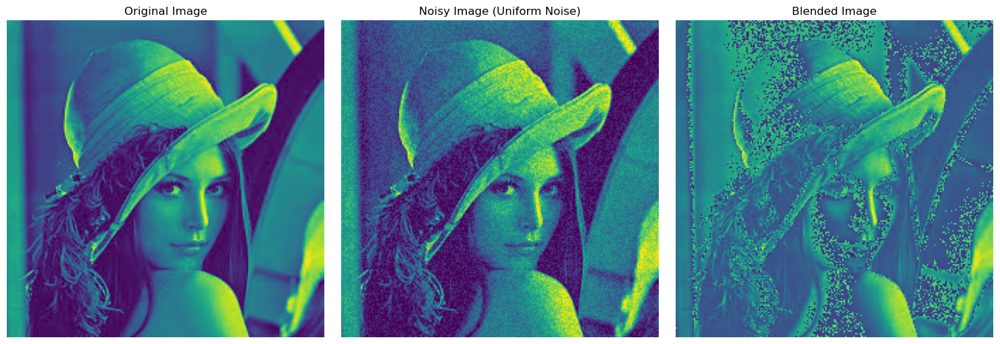

In [17]:
# Add uniform noise to the original image
noisy_image = add_uniform_noise(original_image, low=-0.1, high=0.1)
# Load and preprocess the original image
image_path = 'D:/Journal/4/code/lena.jpg'
original_image = Image.open(image_path).convert('L')  # Convert to grayscale
original_image = img_as_float(np.array(original_image))

# Add uniform noise to the original image
noisy_image = add_uniform_noise(original_image, low=-0.1, high=0.1)

# Flatten the noisy image for clustering
data = noisy_image.flatten().astype(np.float32)  # Convert to float32 and 1D array

# Apply Fuzzy C-Means clustering
n_clusters = 2  # Number of clusters
cntr, u, _, _, _, _, _ = fuzz.cluster.cmeans(
    data.reshape(1, -1), c=n_clusters, m=2, error=0.005, maxiter=1000, init=None
)

# Reshape the membership matrix to obtain the clustered labels
cluster_labels = np.argmax(u, axis=0)
clustered_img = cluster_labels.reshape(noisy_image.shape)

# Blend the original and clustered images
alpha = 0.7  # Blending ratio
blended_image = cv2.addWeighted(original_image, alpha, clustered_img.astype(float), 1 - alpha, 0)

# Calculate metrics for original, noisy, and clustered images
metrics = calculate_metrics(original_image, noisy_image, blended_image)

# Print the results
for metric, value in metrics.items():
    print(f"{metric}: {value:.4f}")

# Plot the images
plt.figure(figsize=(15, 5))

# Original image
plt.subplot(1, 3, 1)
plt.imshow(original_image)
plt.title("Original Image")
plt.axis('off')

# Noisy image
plt.subplot(1, 3, 2)
plt.imshow(noisy_image)
plt.title("Noisy Image (Uniform Noise)")
plt.axis('off')

# Blended image
plt.subplot(1, 3, 3)
plt.imshow(blended_image)
plt.title("Blended Image")
plt.axis('off')

plt.tight_layout()
plt.show()


Mean (Original): 0.3496
STD (Original): 0.2375
Mean (Noisy): 0.3560
STD (Noisy): 0.2518
Mean (Clustered): 0.4186
STD (Clustered): 0.1146
Similarity Accuracy (SA) - Noisy: 0.8749
Similarity Accuracy (SA) - Clustered: 0.6999
Dissimilarity Score (SDS) - Noisy: 0.7589
Dissimilarity Score (SDS) - Clustered: 0.4112
Matthews Correlation Coefficient (MCC) - Noisy: 0.6795
Matthews Correlation Coefficient (MCC) - Clustered: 0.2119


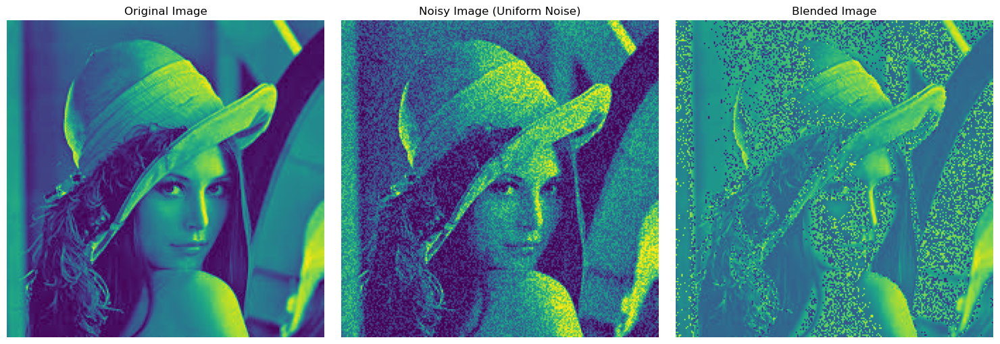

In [18]:
# Add uniform noise to the original image
noisy_image = add_uniform_noise(original_image, low=-0.1, high=0.1)
# Load and preprocess the original image
image_path = 'D:/Journal/4/code/lena.jpg'
original_image = Image.open(image_path).convert('L')  # Convert to grayscale
original_image = img_as_float(np.array(original_image))

# Add uniform noise to the original image
noisy_image = add_uniform_noise(original_image, low=-0.2, high=0.2)

# Flatten the noisy image for clustering
data = noisy_image.flatten().astype(np.float32)  # Convert to float32 and 1D array

# Apply Fuzzy C-Means clustering
n_clusters = 2  # Number of clusters
cntr, u, _, _, _, _, _ = fuzz.cluster.cmeans(
    data.reshape(1, -1), c=n_clusters, m=2, error=0.005, maxiter=1000, init=None
)

# Reshape the membership matrix to obtain the clustered labels
cluster_labels = np.argmax(u, axis=0)
clustered_img = cluster_labels.reshape(noisy_image.shape)

# Blend the original and clustered images
alpha = 0.7  # Blending ratio
blended_image = cv2.addWeighted(original_image, alpha, clustered_img.astype(float), 1 - alpha, 0)

# Calculate metrics for original, noisy, and clustered images
metrics = calculate_metrics(original_image, noisy_image, blended_image)

# Print the results
for metric, value in metrics.items():
    print(f"{metric}: {value:.4f}")

# Plot the images
plt.figure(figsize=(15, 5))

# Original image
plt.subplot(1, 3, 1)
plt.imshow(original_image)
plt.title("Original Image")
plt.axis('off')

# Noisy image
plt.subplot(1, 3, 2)
plt.imshow(noisy_image)
plt.title("Noisy Image (Uniform Noise)")
plt.axis('off')

# Blended image
plt.subplot(1, 3, 3)
plt.imshow(blended_image)
plt.title("Blended Image")
plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
# Add uniform noise to the original image
noisy_image = add_uniform_noise(original_image, low=-0.1, high=0.1)
# Load and preprocess the original image
image_path = 'D:/Journal/4/code/lena.jpg'
original_image = Image.open(image_path).convert('L')  # Convert to grayscale
original_image = img_as_float(np.array(original_image))

# Add uniform noise to the original image
noisy_image = add_uniform_noise(original_image, low=-0.3, high=0.3)

# Flatten the noisy image for clustering
data = noisy_image.flatten().astype(np.float32)  # Convert to float32 and 1D array

# Apply Fuzzy C-Means clustering
n_clusters = 2  # Number of clusters
cntr, u, _, _, _, _, _ = fuzz.cluster.cmeans(
    data.reshape(1, -1), c=n_clusters, m=2, error=0.005, maxiter=1000, init=None
)

# Reshape the membership matrix to obtain the clustered labels
cluster_labels = np.argmax(u, axis=0)
clustered_img = cluster_labels.reshape(noisy_image.shape)

# Blend the original and clustered images
alpha = 0.7  # Blending ratio
blended_image = cv2.addWeighted(original_image, alpha, clustered_img.astype(float), 1 - alpha, 0)

# Calculate metrics for original, noisy, and clustered images
metrics = calculate_metrics(original_image, noisy_image, blended_image)

# Print the results
for metric, value in metrics.items():
    print(f"{metric}: {value:.4f}")

# Plot the images
plt.figure(figsize=(15, 5))

# Original image
plt.subplot(1, 3, 1)
plt.imshow(original_image)
plt.title("Original Image")
plt.axis('off')

# Noisy image
plt.subplot(1, 3, 2)
plt.imshow(noisy_image)
plt.title("Noisy Image (Uniform Noise)")
plt.axis('off')

# Blended image
plt.subplot(1, 3, 3)
plt.imshow(blended_image)
plt.title("Blended Image")
plt.axis('off')

plt.tight_layout()
plt.show()
